In [2]:
# Useful patches means patches with pv panels to augment 
from tensorflow.keras.utils import normalize
import os
import cv2
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
#from patchify import patchify, unpatchify
import numpy as np
from matplotlib import pyplot as plt
import tifffile as tiff
from tifffile import imread, imwrite
from skimage.transform import resize
import tensorflow as tf

# Useful Pacthes

In [123]:
image_directory='/home/gridsan/ealmahmoud/patches/patches_5k/images/'
mask_directory='/home/gridsan/ealmahmoud/patches/patches_5k/masks/'
images = os.listdir(image_directory)
masks = os.listdir(mask_directory)


In [124]:
len(masks)

5000

In [ ]:
all_mask_patches = []
all_img_patches = []
count=0
for i, mask_name in enumerate(masks):    #Remember enumerate method adds a counter and returns the enumerate object
    if (mask_name.split('.')[1] == 'tif'):
        #print("Now preparing image and masks number: ", mask_name)
        
        
        temp_image=tiff.imread(image_directory+mask_name)
        temp_mask=tiff.imread(mask_directory+mask_name)

        single_patch_img = (temp_image.astype('float32')) / 255.
        single_patch_mask = (temp_mask.astype('float32')) / 255.


        val, counts = np.unique(single_patch_mask, return_counts=True)
        if (1 - (counts[0]/counts.sum())) > 0.25:
            tiff.imwrite('/home/gridsan/ealmahmoud/patches/patches_useful/images/' + mask_name, temp_image)
            tiff.imwrite('/home/gridsan/ealmahmoud/patches/patches_useful/masks/' + mask_name, temp_mask)
            count = count + 1
            print(str(count))
        if (count ==1000):
            print("break")
            break

In [126]:
image_directory='/home/gridsan/ealmahmoud/patches/patches_useful/images/'
mask_directory='/home/gridsan/ealmahmoud/patches/patches_useful/masks/'
images = os.listdir(image_directory)
masks = os.listdir(mask_directory)

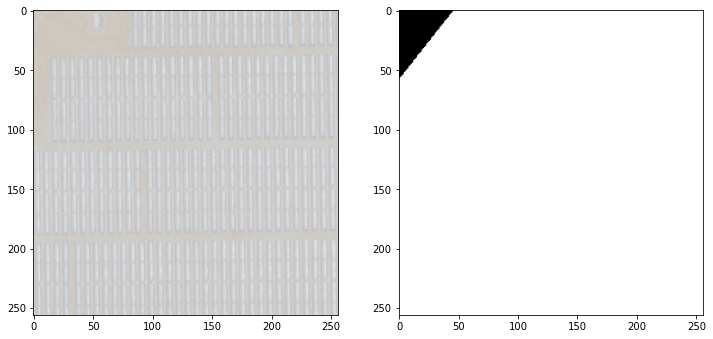

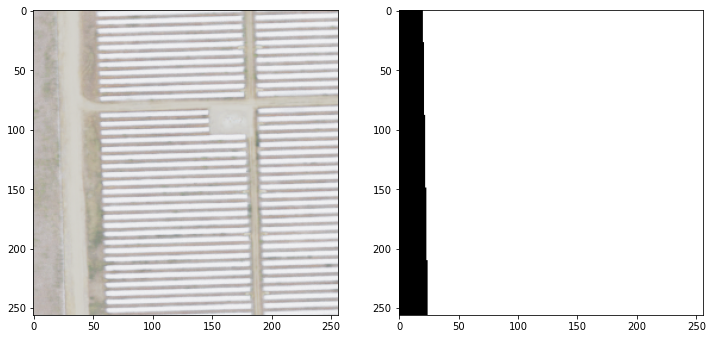

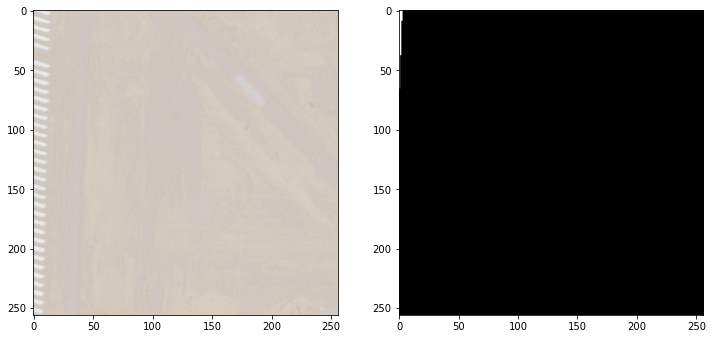

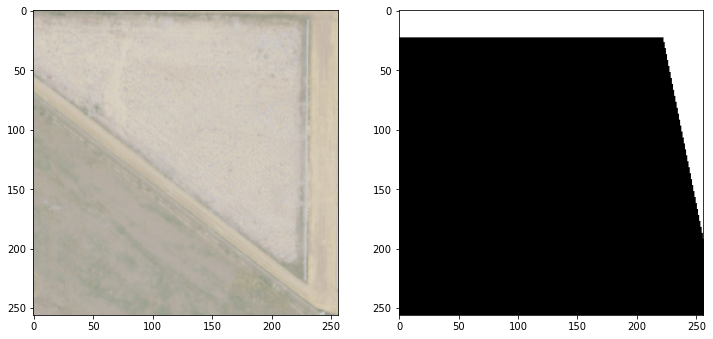

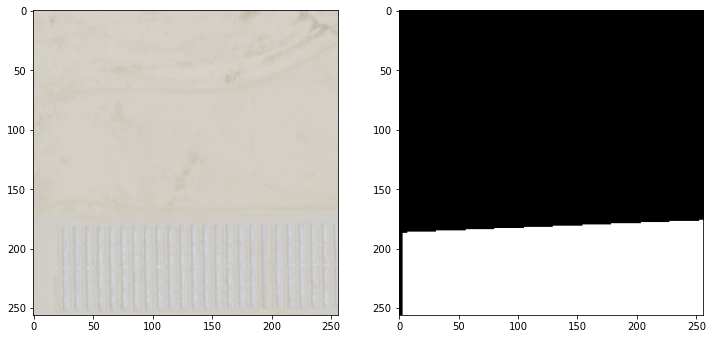

...

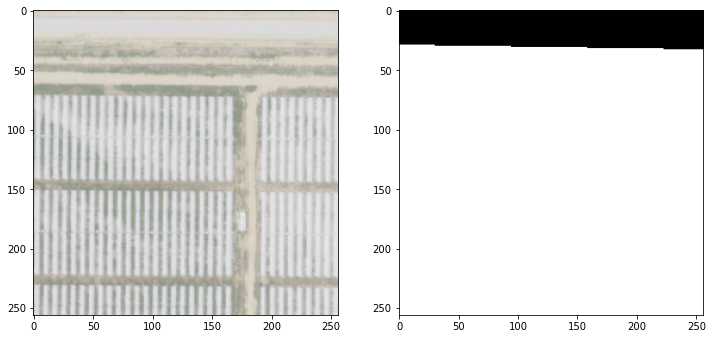

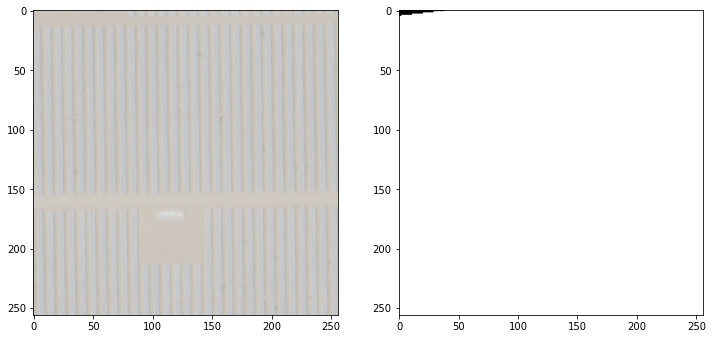

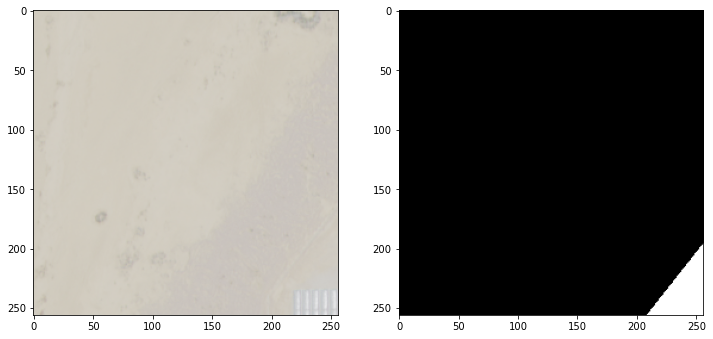

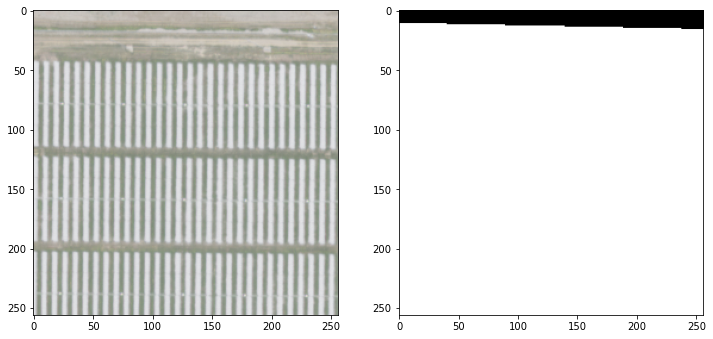

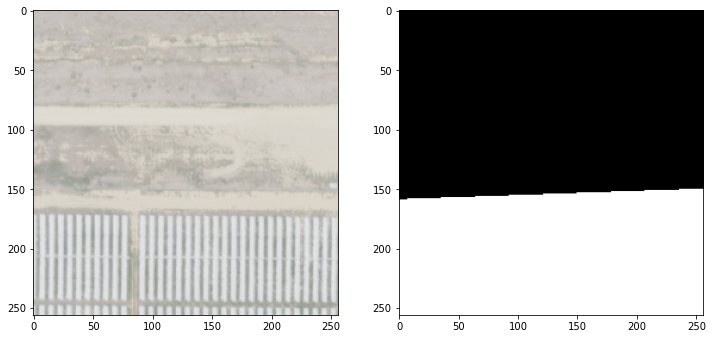

In [134]:
import random
import numpy as np
for i in range(100):
    plt.figure(figsize=(12, 6))
    plt.subplot(121)
    plt.imshow(images[i], cmap='gray')
    plt.subplot(122)
    plt.imshow(masks[i], cmap='gray', vmin=0, vmax=1)
    plt.show()